# Cancer usecase

In [1]:
from scprint import scPrint
from scdataloader import Preprocessor
from scprint.tasks import GRNfer, Embedder

from bengrn import BenGRN, get_sroy_gt
import scanpy as sc
from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils
from grnndata import read_h5ad

from scprint.tasks import Denoiser, withknn
from matplotlib import pyplot as plt
from scdataloader import utils as data_utils
from anndata import concat
import numpy as np
import lamindb as ln

%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:53: DeprecationWarning: jax.core.Shape is deprecated. Use Shape = Sequence[int | Any].
  Shape = jax.core.Shape
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:54: DeprecationWarning: jax.random.KeyArray is deprecated. Use jax.Array for annotations, and jax.dtypes.issubdtype(arr.dtype, jax.dtypes.prng_key) for runtime detection of typed prng keys (i.e. keys created with jax.random.key).
For more information, see https://jax.readthedocs.io/en/latest/jep/9263-typed-keys.html
  PRNGKey = jax.random.KeyArray
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_types.py:9: DeprecationWarning: jax.random.KeyArray is deprecated. Use jax.Array for annotations, and jax.dtypes.i

## Getting the datasets and performing embedding and annotations

1. load the datasets
   
https://cellxgene.cziscience.com/e/574e9f9e-f8b4-41ef-bf19-89a9964fd9c7.cxg/ ? prostate

https://cellxgene.cziscience.com/e/d77ec7d6-ef2e-49d6-9e79-05b7f8881484.cxg/ ? normal 

2. 

In [19]:
cx_dataset = ln.Collection.using(instance="laminlabs/cellxgene").filter(name="cellxgene-census", version='2023-12-15').one()

In [2]:
prostate_normal = cx_dataset.artifacts.filter(key='cell-census/2023-12-15/h5ads/d77ec7d6-ef2e-49d6-9e79-05b7f8881484.h5ad').one().load()
sc.pl.umap(prostate_normal)

NameError: name 'cx_dataset' is not defined

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/asyncio/sslproto.py:320: ResourceWarning: unclosed transport <asyncio.sslproto._SSLProtocolTransport object at 0x7fc85d29fac0>
  _warn(f"unclosed transport {self!r}", ResourceWarning, source=self)


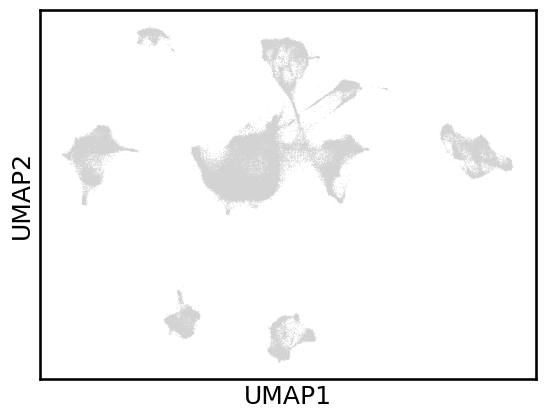

In [ ]:
prostate_tumor = cx_dataset.artifacts.filter(key='cell-census/2023-12-15/h5ads/574e9f9e-f8b4-41ef-bf19-89a9964fd9c7.h5ad').one().load()
sc.pl.umap(prostate_tumor)

In [22]:
prostate_normal.obs.drop(columns="is_primary_data", inplace=True)
prostate_tumor.obs.drop(columns="is_primary_data", inplace=True)

In [23]:
preprocessor = Preprocessor(subset_hvg=3000, do_postp=False)
prostate_normal = preprocessor(prostate_normal)
prostate_tumor = preprocessor (prostate_tumor)

Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 0 non primary cells, 16375 renamining
filtered out 0 cells, 16375 renamining
Removed 132 genes.
validating


/home/ml4ig1/Documents code/scPRINT/scDataLoader/scdataloader/preprocess.py:241: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data_utils.validate(adata, organism=adata.obs.organism_ontology_term_id[0])


startin QC
Seeing 10982 outliers (67.07% of total dataset):
done
Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 0 non primary cells, 83451 renamining
filtered out 0 cells, 83451 renamining
Removed 76 genes.
validating


/home/ml4ig1/Documents code/scPRINT/scDataLoader/scdataloader/preprocess.py:241: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data_utils.validate(adata, organism=adata.obs.organism_ontology_term_id[0])


startin QC

Seeing 13047 outliers (15.63% of total dataset):
done


## embed and annotate

In [2]:
model = scPrint.load_from_checkpoint('../data/temp/o2uniqsx/epoch=18-step=133000.ckpt', precpt_gene_emb = None)

RuntimeError caught: scPrint is not attached to a `Trainer`.



In [29]:
embedder = Embedder(model, how="random expr", max_len=2200, add_zero_genes=0, num_workers=16, pred_embedding = ["cell_type_ontology_term_id"])

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'init_dataset'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

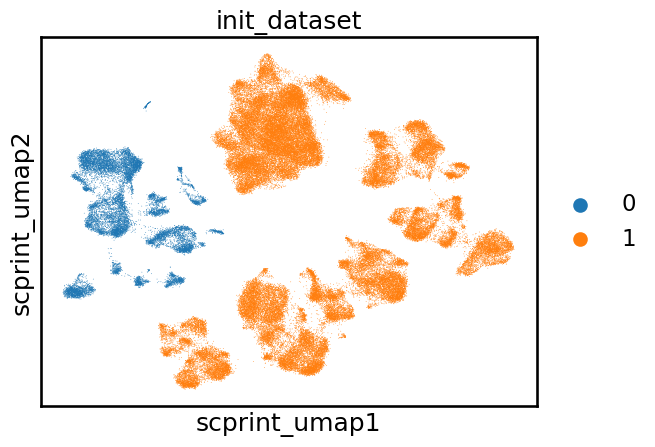

In [28]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='init_dataset', show=False)


100%|██████████| 1560/1560 [16:45<00:00,  1.55it/s]


AnnData object with n_obs × n_vars = 99826 × 512
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

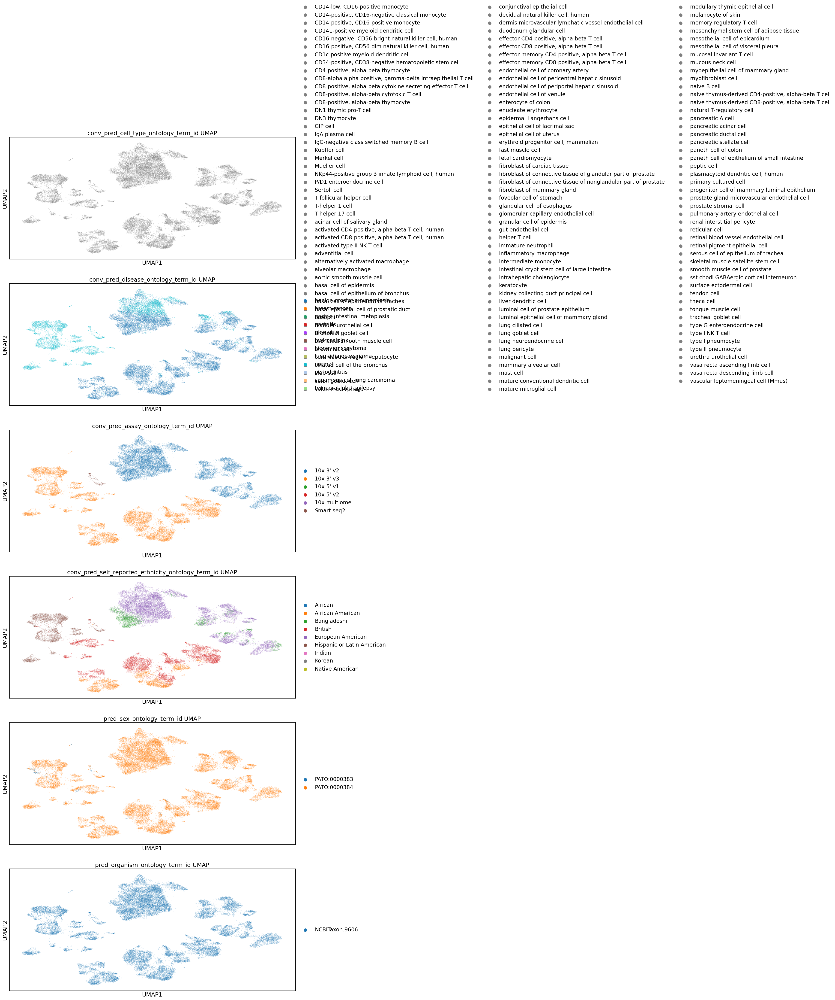

couldn't log to tensorboard
couldn't log to wandb
     cell_type_ontology_term_id
     accuracy: 0.7116582854166249
 
     disease_ontology_term_id
     accuracy: 0.8482158956584457
 
     assay_ontology_term_id
     accuracy: 0.9992687275859996
 
     self_reported_ethnicity_ontology_term_id
     accuracy: 0.9493318373970709
 
     sex_ontology_term_id
     accuracy: 0.9922565263558591
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [27]:
prostate_combined, metrics = embedder(concat([prostate_normal, prostate_tumor], label="init_dataset"), cache=False, output_expression="none")

100%|██████████| 1560/1560 [28:20<00:00,  1.09s/it]


AnnData object with n_obs × n_vars = 99826 × 424
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

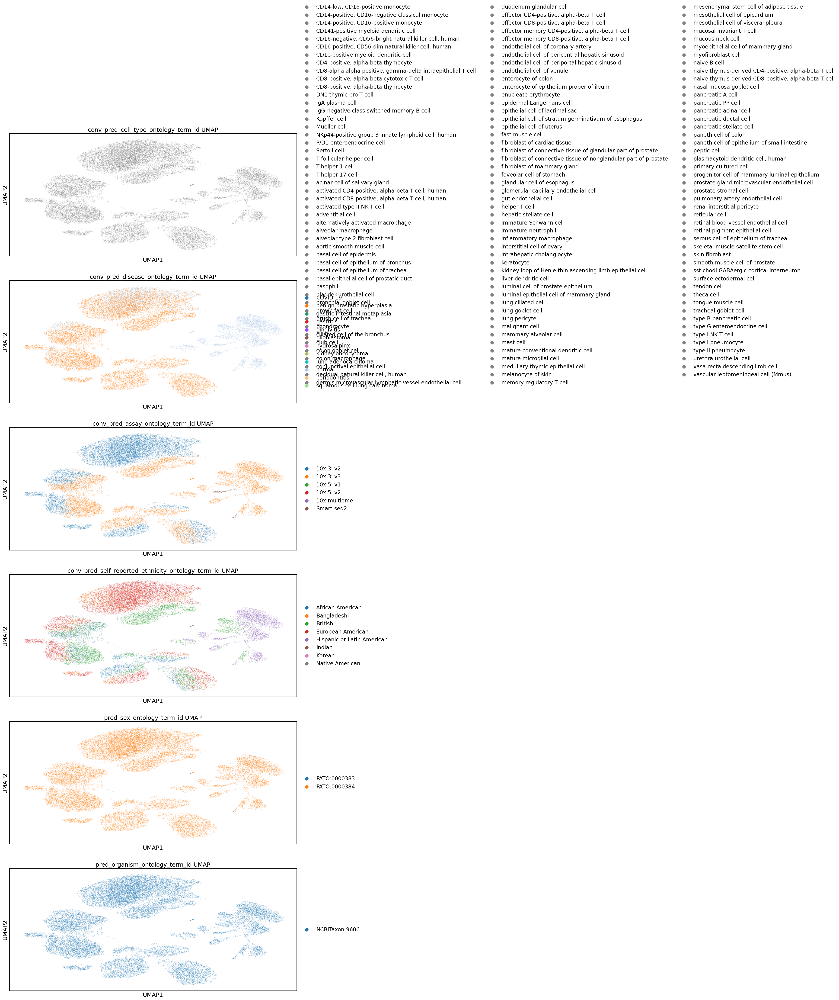

couldn't log to tensorboard
couldn't log to wandb

couldn't log to wandb
     cell_type_ontology_term_id
     accuracy: 0.7250215374752068
 
     disease_ontology_term_id
     accuracy: 0.8394506441207702
 
     assay_ontology_term_id
     accuracy: 0.998988239536794
 
     self_reported_ethnicity_ontology_term_id
     accuracy: 0.9504037024422495
 
     sex_ontology_term_id
     accuracy: 0.9948911105323263
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [10]:
prostate_combined, metrics = embedder(concat([prostate_normal, prostate_tumor], label="init_dataset"), cache=False, output_expression="none")

In [16]:
prostate_combined

AnnData object with n_obs × n_vars = 99826 × 70116
    obs: 'assay_ontology_term_id', 'donor_id', 'sex_ontology_term_id', 'disease_ontology_term_id', 'organism_ontology_term_id', 'suspension_type', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'init_dataset', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


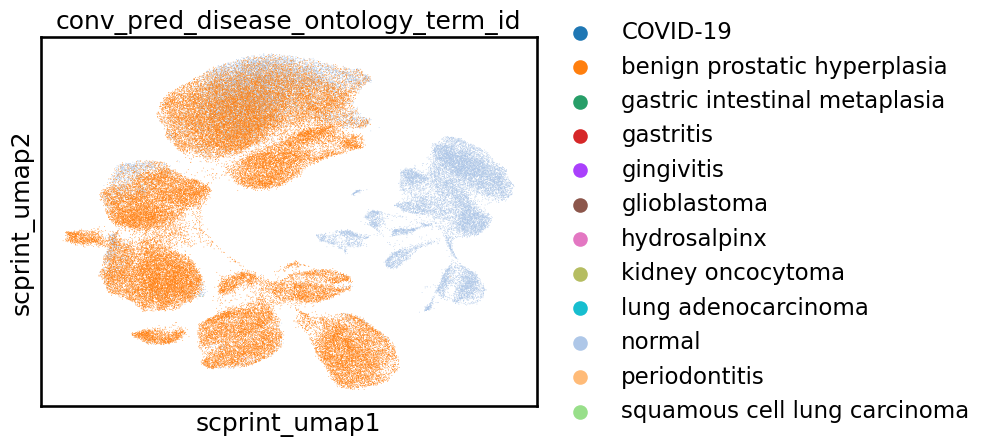

In [18]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color=['conv_pred_disease_ontology_term_id'])

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

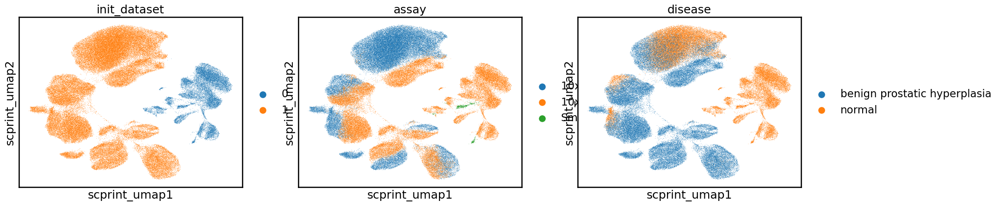

In [17]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color=['init_dataset','assay', 'disease'])

In [ ]:
prostate_combined.obs['cleaned_pred_cell_type_ontology_term_id'].value_counts()

## cleanup and showcase the different main annotations

<Axes: ylabel='count'>

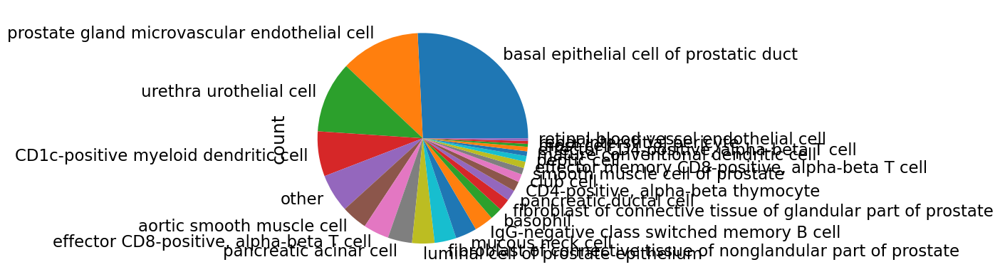

In [12]:
prostate_combined.obs['cleaned_pred_cell_type_ontology_term_id'] = prostate_combined.obs['conv_pred_cell_type_ontology_term_id'].astype(str)
prostate_combined.obs.loc[~prostate_combined.obs['conv_pred_cell_type_ontology_term_id'].isin([k for k, v in prostate_combined.obs['conv_pred_cell_type_ontology_term_id'].value_counts().items() if v > 400]), 'cleaned_pred_cell_type_ontology_term_id'] = "other"
prostate_combined.obs['cleaned_pred_cell_type_ontology_term_id'].value_counts().plot.pie()

<Axes: ylabel='count'>

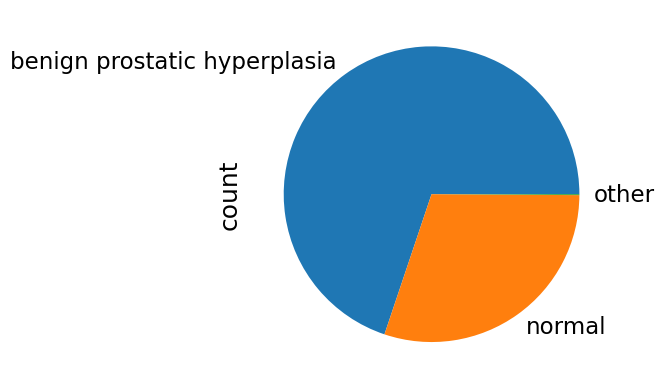

In [13]:
prostate_combined.obs['cleaned_pred_disease_ontology_term_id'] = prostate_combined.obs['conv_pred_disease_ontology_term_id'].astype(str)
prostate_combined.obs.loc[~prostate_combined.obs['conv_pred_disease_ontology_term_id'].isin([k for k, v in prostate_combined.obs['conv_pred_disease_ontology_term_id'].value_counts().items() if v > 1000]), 'cleaned_pred_disease_ontology_term_id'] = "other"
prostate_combined.obs['cleaned_pred_disease_ontology_term_id'].value_counts().plot.pie()

In [15]:
del prostate_normal, prostate_tumor

In [17]:
prostate_combined.write_h5ad("../data/prostate_combined_o2uniqsx.h5ad")

In [30]:
prostate_combined = sc.read_h5ad("../data/prostate_combined_o2uniqsx.h5ad")

## Looking at one specific rare cell type and performing denoising for further analysis (here, differential expression analysis)

In [ ]:
prostate_combined.values

In [40]:
prostate_combined

AnnData object with n_obs × n_vars = 99826 × 70116
    obs: 'assay_ontology_term_id', 'donor_id', 'sex_ontology_term_id', 'disease_ontology_term_id', 'organism_ontology_term_id', 'suspension_type', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'init_dataset', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology

In [56]:
prostate_combined.obsm['X_pca'] = sc.pp.pca(prostate_combined.obsm['scprint'], n_comps=21)[:,3:]

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [57]:
sc.pp.neighbors(prostate_combined, use_rep='X_pca')
sc.tl.umap(prostate_combined)

In [6]:
prostate_combined.obs[prostate_combined.obs.init_dataset=='0'].cell_type.value_counts().head(20)

cell_type
epithelial cell                        6848
basal cell of prostate epithelium      3298
luminal cell of prostate epithelium    1092
CD8-positive, alpha-beta T cell        1081
club cell                              1078
macrophage                              682
T cell                                  586
endothelial cell                        585
mature NK T cell                        430
smooth muscle cell                      285
fibroblast                              223
erythroid progenitor cell                86
monocyte                                 33
stromal cell                             32
neutrophil                               16
sperm                                    11
mast cell                                 9
natural killer cell                       0
plasmacytoid dendritic cell               0
plasma cell                               0
Name: count, dtype: int64

In [5]:
prostate_combined.obs[prostate_combined.obs.init_dataset=='1'].cell_type.value_counts().head(20)

cell_type
basal cell of prostate epithelium                                   27979
prostate gland microvascular endothelial cell                       11545
epithelial cell of urethra                                           7667
fibroblast of connective tissue of nonglandular part of prostate     3827
secretory cell                                                       3655
CD1c-positive myeloid dendritic cell                                 3605
dendritic cell                                                       2988
effector CD8-positive, alpha-beta T cell                             2886
luminal cell of prostate epithelium                                  2826
B cell                                                               2699
granulocyte                                                          2354
pericyte                                                             2200
CD4-positive, alpha-beta thymocyte                                   2057
smooth muscle cell of prosta

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


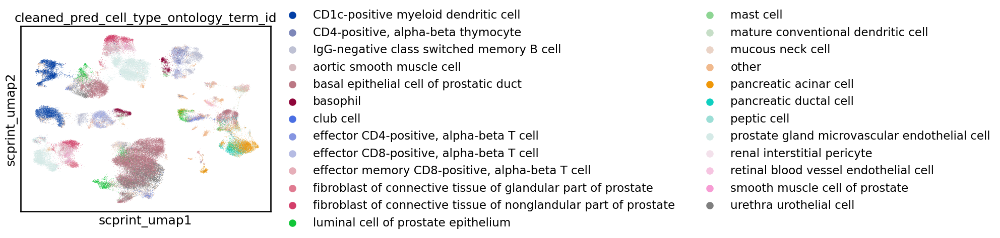

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


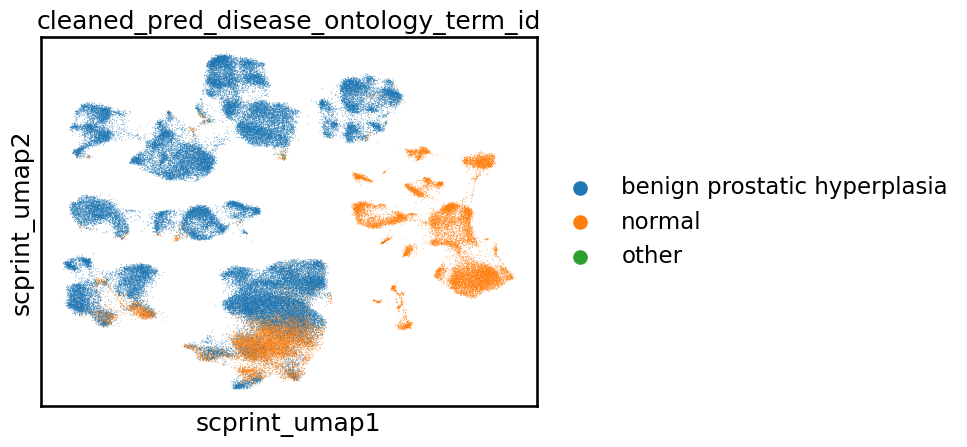

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


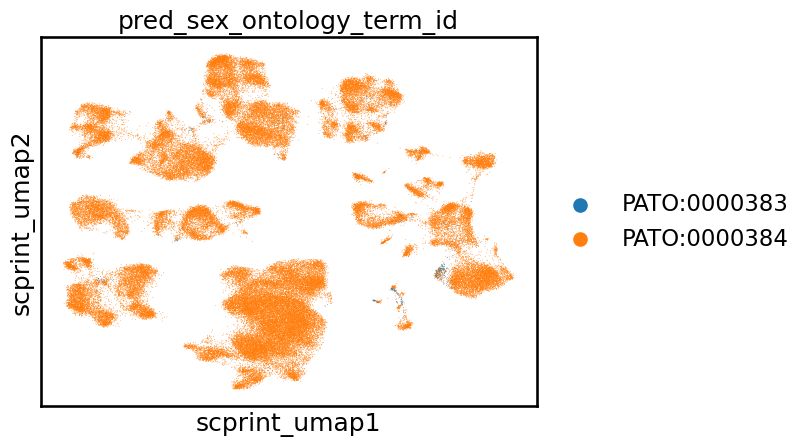

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


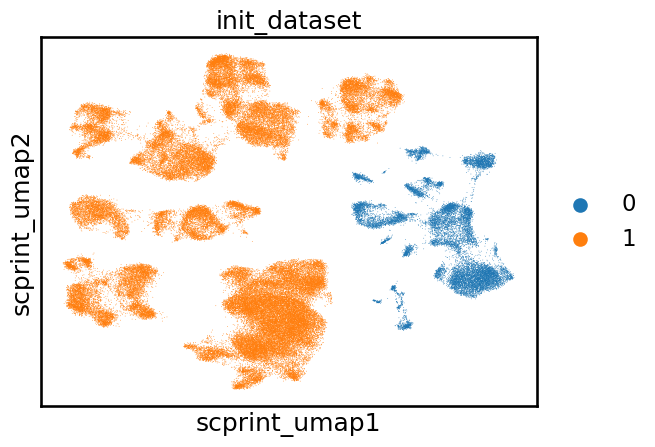

In [3]:
sc.pl.embedding(prostate_combined, basis="scprint_umap",color='cleaned_pred_cell_type_ontology_term_id', show=False)
plt. show()
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='cleaned_pred_disease_ontology_term_id', show=False)
plt.show()
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='pred_sex_ontology_term_id', show=False)
plt.show()
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='init_dataset', show=False)
plt.show()

In [5]:
# do louvain mutliple times
sc.pp.neighbors(prostate_combined, n_neighbors=10, use_rep="scprint")
sc.tl.louvain(prostate_combined, resolution=0.5, key_added="louvain_0.5")
sc.tl.louvain(prostate_combined, resolution=1.0, key_added="louvain_1.0")

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'louvain_1.0'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

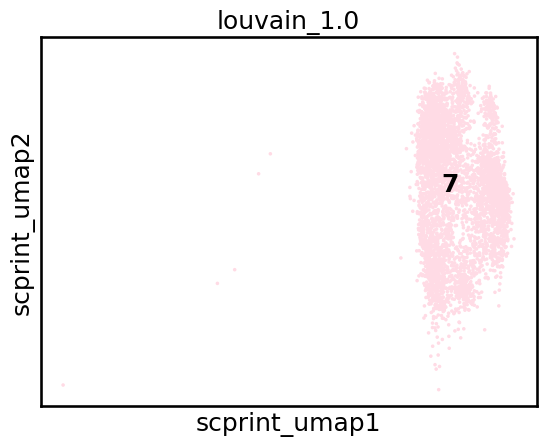

In [18]:
sc.pl.embedding(prostate_combined[prostate_combined.obs['louvain_1.0']=="7"], basis="scprint_umap", color='louvain_1.0', show=False, legend_loc="on data")

In [18]:
prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id.value_counts()

cleaned_pred_cell_type_ontology_term_id
basal cell of epidermis                                             22449
mammary alveolar cell                                                9688
vasa recta descending limb cell                                      8777
CD1c-positive myeloid dendritic cell                                 5782
effector memory CD8-positive, alpha-beta T cell                      5410
smooth muscle cell of the pulmonary artery                           5007
other                                                                4972
pancreatic acinar cell                                               4639
basal epithelial cell of prostatic duct                              3405
serous cell of epithelium of trachea                                 3327
prostate gland microvascular endothelial cell                        2747
paneth cell of epithelium of small intestine                         2698
mast cell                                                            236

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'init_dataset'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

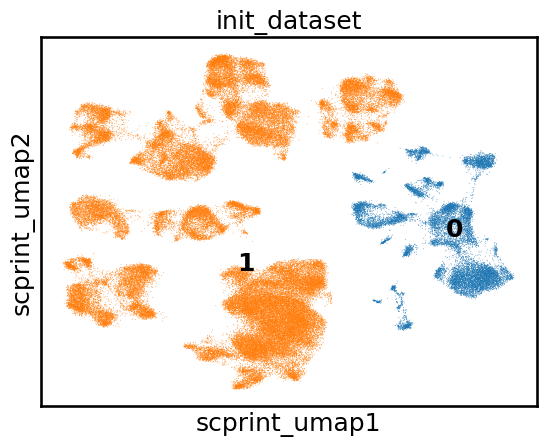

In [36]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='init_dataset', show=False, legend_loc="on data")

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'louvain_1.0'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

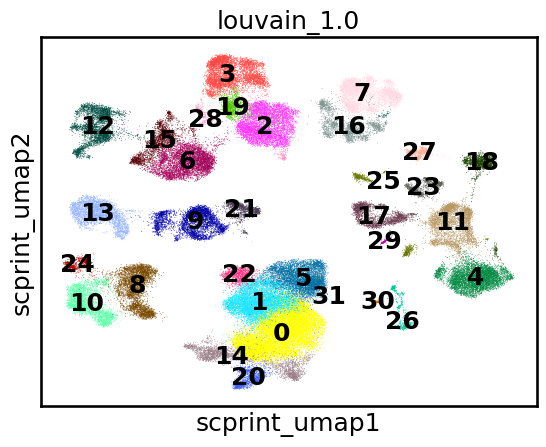

In [35]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='louvain_1.0', show=False, legend_loc="on data")

In [19]:
i=9
loc = prostate_combined.obs['louvain_1.0']==str(i)
prostate_combined.obs[loc].conv_pred_disease_ontology_term_id.value_counts().head(2), prostate_combined.obs[loc].conv_pred_cell_type_ontology_term_id.value_counts().head(5)

(conv_pred_disease_ontology_term_id
 benign prostatic hyperplasia    3276
 normal                           948
 Name: count, dtype: int64,
 conv_pred_cell_type_ontology_term_id
 aortic smooth muscle cell                                           1319
 fibroblast of connective tissue of glandular part of prostate       1114
 fibroblast of connective tissue of nonglandular part of prostate    1101
 smooth muscle cell of prostate                                       569
 prostate gland microvascular endothelial cell                         82
 Name: count, dtype: int64)

In [19]:
i=7
loc = prostate_combined.obs['louvain_1.0']==str(i)
prostate_combined.obs[loc].cleaned_pred_disease_ontology_term_id.value_counts().head(2), prostate_combined.obs[loc].cleaned_pred_cell_type_ontology_term_id.value_counts().head(5)

(cleaned_pred_disease_ontology_term_id
 benign prostatic hyperplasia    4467
 normal                            61
 Name: count, dtype: int64,
 cleaned_pred_cell_type_ontology_term_id
 IgG-negative class switched memory B cell    1618
 effector CD8-positive, alpha-beta T cell     1315
 CD4-positive, alpha-beta thymocyte           1028
 other                                         361
 effector CD4-positive, alpha-beta T cell      123
 Name: count, dtype: int64)

In [20]:
loc = loc&(prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id=="IgG-negative class switched memory B cell")
prostate_combined.obs[loc].cleaned_pred_disease_ontology_term_id.value_counts().head(2)

cleaned_pred_disease_ontology_term_id
benign prostatic hyperplasia    1592
normal                            25
Name: count, dtype: int64

In [13]:
prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id.value_counts().head(60)

cleaned_pred_cell_type_ontology_term_id
basal epithelial cell of prostatic duct                             25740
prostate gland microvascular endothelial cell                       12165
urethra urothelial cell                                             10952
CD1c-positive myeloid dendritic cell                                 6898
other                                                                5869
aortic smooth muscle cell                                            3970
effector CD8-positive, alpha-beta T cell                             3925
pancreatic acinar cell                                               3711
luminal cell of prostate epithelium                                  3435
fibroblast of connective tissue of nonglandular part of prostate     3334
mucous neck cell                                                     3260
IgG-negative class switched memory B cell                            2932
basophil                                                             186

In [11]:
prostate_combined.obs[prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id=="IgG-negative class switched memory B cell"].cleaned_pred_disease_ontology_term_id.value_counts().head(2)

cleaned_pred_disease_ontology_term_id
benign prostatic hyperplasia    2865
normal                            62
Name: count, dtype: int64

In [21]:
prostate_combined.obs['focus'] = "other"
prostate_combined.obs.loc[loc, 'focus'] = "memory B cell"
prostate_combined.obs.loc[loc & (prostate_combined.obs['cleaned_pred_disease_ontology_term_id']=='benign prostatic hyperplasia'), 'focus'] = "cancer associated memory B cell"

In [33]:
prostate_combined.obs['focus'].value_counts()

focus
other                              98204
cancer associated memory B cell     1596
memory B cell                         26
Name: count, dtype: int64

In [27]:
(prostate_combined[prostate_combined.obs['louvain_1.0']==str(i)] & (prostate_combined.obsm['scprint_umap'][:,0]<4)

5

... storing 'focus' as categorical
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'focus'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

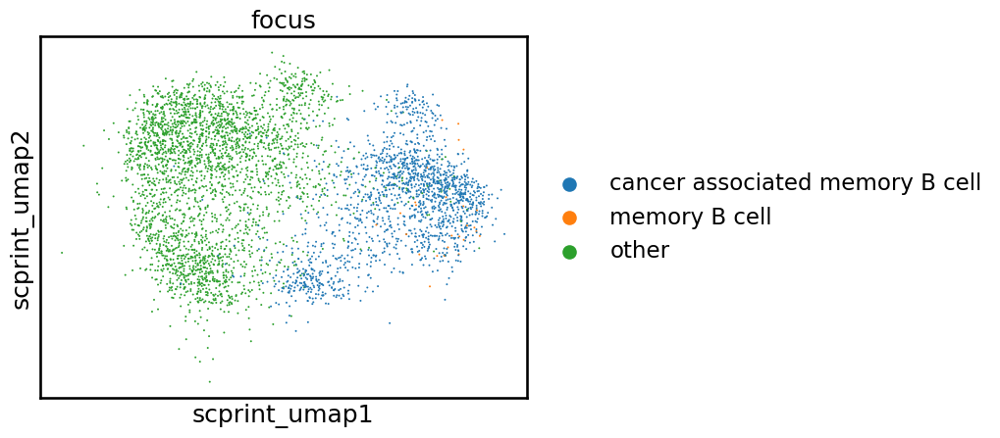

In [29]:
sc.pl.embedding(prostate_combined[(prostate_combined.obs['louvain_1.0']==str(i)) & (prostate_combined.obsm['scprint_umap'][:,0]>4)], basis="scprint_umap",color='focus', show=False, size=8)

... storing 'focus' as categorical
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'cleaned_pred_cell_type_ontology_term_id'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

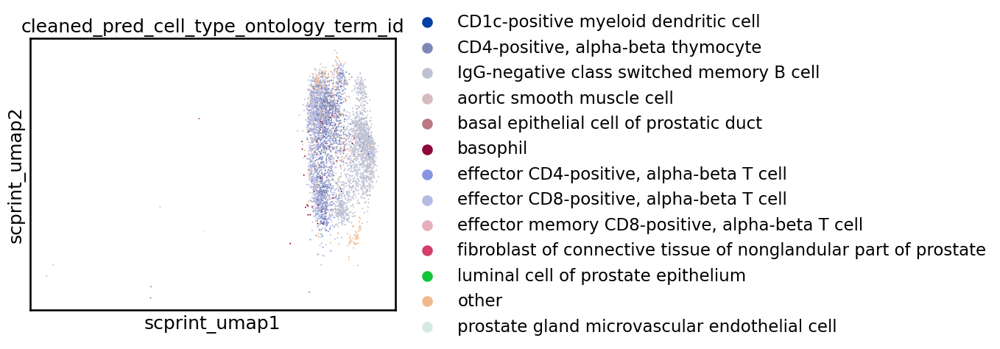

In [36]:
# plot the cell type distribution of the cells in the dataset, highlight the cells in umap
sc.pl.embedding(prostate_combined[prostate_combined.obs['louvain_1.0']==str(i)], basis="scprint_umap",color='cleaned_pred_cell_type_ontology_term_id', show=False, size=8)

## perform diff expr on this small subgroup vs rest

In [11]:
genedf = data_utils.load_genes(prostate_combined.obs.organism_ontology_term_id.iloc[0])
prostate_combined.var = genedf.loc[prostate_combined.var.index].drop(columns=["stable_id", "created_at", "updated_at"])

... storing 'focus' as categorical
... storing 'symbol' as categorical
... storing 'ncbi_gene_ids' as categorical
... storing 'biotype' as categorical
... storing 'description' as categorical
... storing 'synonyms' as categorical
... storing 'organism' as categorical


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


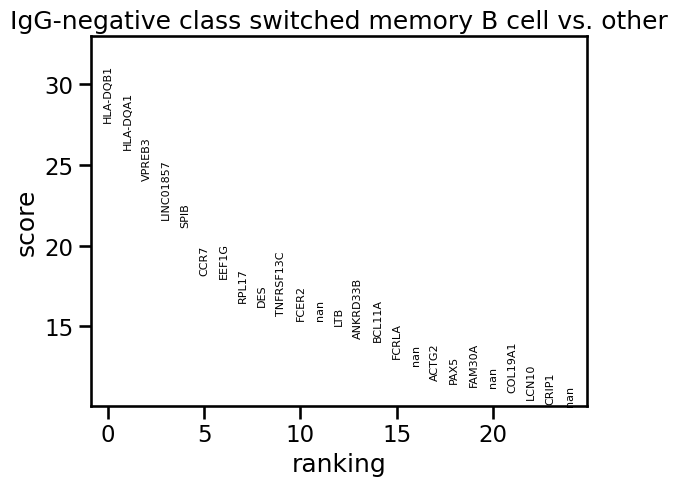

In [14]:
sc.tl.rank_genes_groups(prostate_combined, groupby='cleaned_pred_cell_type_ontology_term_id', groups=['IgG-negative class switched memory B cell'], reference='other', method='t-test')
# Plot the most differentially expressed genes
sc.pl.rank_genes_groups(prostate_combined, n_genes=25, sharey=False, gene_symbols='symbol')
# super strong B cell markers

In [13]:
prostate_combined.write_h5ad("../data/prostate_combined_o2uniqsx.h5ad")

... storing 'fibro' as categorical
... storing 'symbol' as categorical
... storing 'ncbi_gene_ids' as categorical
... storing 'biotype' as categorical
... storing 'description' as categorical
... storing 'synonyms' as categorical
... storing 'organism' as categorical


In [3]:
prostate_combined = sc.read_h5ad("../data/prostate_combined_o2uniqsx.h5ad")

## find known genes

find known genes

ALL markers 

except

HLAs nan

did not look post SPIB

In [4]:
prostate_combined

AnnData object with n_obs × n_vars = 99826 × 70116
    obs: 'assay_ontology_term_id', 'donor_id', 'sex_ontology_term_id', 'disease_ontology_term_id', 'organism_ontology_term_id', 'suspension_type', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'init_dataset', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology

In [ ]:
MBNL2 https://arc.net/l/quote/fdvlkxzd
MAGOH https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10259345/
HSDP1 https://www.nature.com/articles/s41598-019-45489-1
BAG5 https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3598994/
CLIC4 https://journals.plos.org/plosgenetics/article?id=10.1371/journal.pgen.1010271

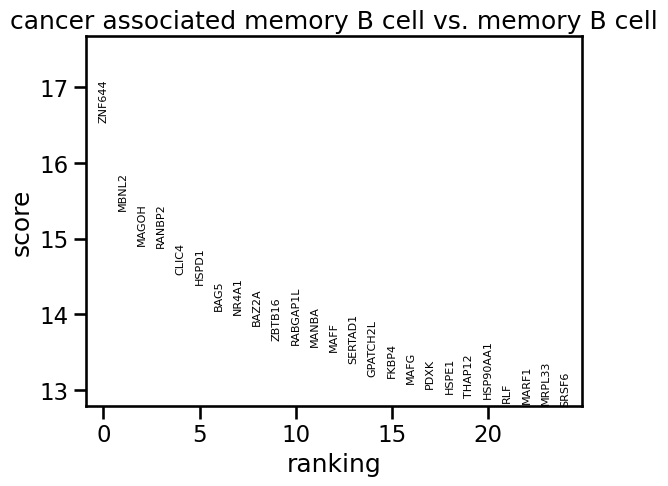

In [16]:
sc.tl.rank_genes_groups(prostate_combined, groupby='focus', groups=['cancer associated memory B cell'], reference='memory B cell', method='t-test')
# Plot the most differentially expressed genes
sc.pl.rank_genes_groups(prostate_combined, n_genes=25, sharey=False, gene_symbols='symbol')
# super strong B cell markers

In [19]:
# perform denoising
denoise = Denoiser(model, batch_size=20, max_len=5000, plot_corr_size=10_000, doplot=False, predict_depth_mult=10, how="random expr")
idx, genes, expr = denoise(prostate_combined[prostate_combined.obs['focus']!="other"])

100%|██████████| 82/82 [00:50<00:00,  1.64it/s]


In [20]:
# recompute diff expr to rest of dataset and compare the two gene sets found
i = 0
prostate_combined.X = prostate_combined.X.tolil()
for idx, val in enumerate(prostate_combined.obs['focus']!="other"):
    if val:
        prostate_combined.X[idx, prostate_combined.var.index.get_indexer(np.array(model.genes)[genes.cpu().numpy()[i]])] = expr[i].cpu().numpy()
        i += 1
prostate_combined.X = prostate_combined.X.tocsr()

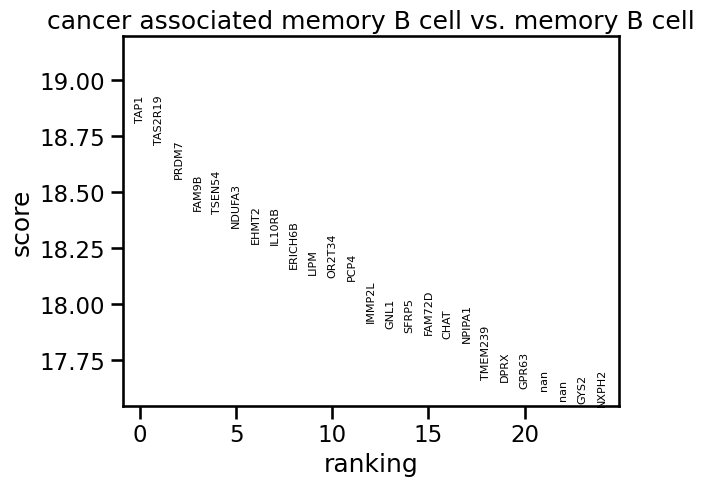

In [21]:
# highlight diff expr genes in fibroblasts and CAFs
sc.tl.rank_genes_groups(prostate_combined, groupby='focus', groups=['cancer associated memory B cell'], reference='memory B cell', method='t-test')
# Plot the most differentially expressed genes
sc.pl.rank_genes_groups(prostate_combined, n_genes=25, sharey=False, gene_symbols='symbol')
# super strong B cell markers

In [9]:
#prostate_combined.write_h5ad("../data/prostate_combined_denoised.h5ad")

In [3]:
prostate_combined = sc.read_h5ad("../data/prostate_combined_denoised.h5ad")

## extracting Gene Regulatory networks and comparing two networks

In [38]:
prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id.value_counts()

cleaned_pred_cell_type_ontology_term_id
basal epithelial cell of prostatic duct                             25740
prostate gland microvascular endothelial cell                       12165
urethra urothelial cell                                             10952
CD1c-positive myeloid dendritic cell                                 6898
other                                                                5869
aortic smooth muscle cell                                            3970
effector CD8-positive, alpha-beta T cell                             3925
pancreatic acinar cell                                               3711
luminal cell of prostate epithelium                                  3435
fibroblast of connective tissue of nonglandular part of prostate     3334
mucous neck cell                                                     3260
IgG-negative class switched memory B cell                            2932
basophil                                                             186

In [6]:
loc = (prostate_combined.obs.cleaned_pred_cell_type_ontology_term_id=="fibroblast of connective tissue of glandular part of prostate")
prostate_combined.obs[loc]['cleaned_pred_disease_ontology_term_id'].value_counts()

cleaned_pred_disease_ontology_term_id
benign prostatic hyperplasia    1239
normal                           572
other                              4
Name: count, dtype: int64

In [7]:
prostate_combined.obs[loc]['louvain_1.0'].value_counts()

louvain_1.0
8     1110
3      494
28     123
10      76
12       3
2        2
15       2
20       1
13       1
0        1
6        1
29       1
27       0
26       0
25       0
30       0
24       0
23       0
22       0
21       0
16       0
19       0
18       0
17       0
1        0
14       0
11       0
9        0
7        0
5        0
4        0
31       0
Name: count, dtype: int64

In [8]:
loc = loc & (prostate_combined.obs['louvain_1.0']=="8")
prostate_combined.obs[loc]['cleaned_pred_disease_ontology_term_id'].value_counts()

cleaned_pred_disease_ontology_term_id
benign prostatic hyperplasia    602
normal                          508
other                             0
Name: count, dtype: int64

In [9]:
prostate_combined.obs.fibro = "other"
prostate_combined.obs.loc[loc, 'fibro']="fibroblasts"
prostate_combined.obs.loc[loc & (prostate_combined.obs.cleaned_pred_disease_ontology_term_id=="benign prostatic hyperplasia"), 'fibro']="cancer associated fibroblasts"

... storing 'fibro' as categorical
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


<Axes: title={'center': 'fibro'}, xlabel='scprint_umap1', ylabel='scprint_umap2'>

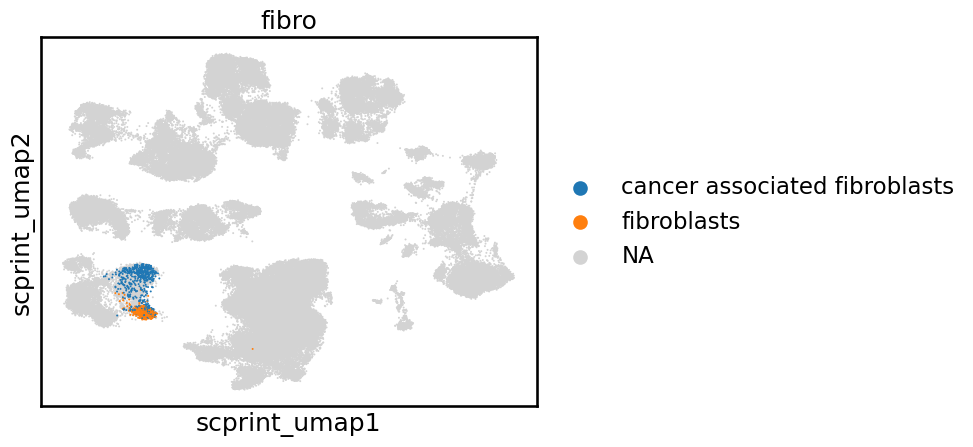

In [47]:
sc.pl.embedding(prostate_combined, basis="scprint_umap", color='fibro', show=False, size=8)

In [5]:
grn_inferer = GRNfer(model, prostate_combined,
                     how="most var across",
                     preprocess="softmax",
                     head_agg='none',
                     filtration="none",
                     forward_mode="none",
                     apc=False,
                     symmetrize=False,
                     num_genes=4000,
                     max_cells=300,
                     doplot=False,
                     batch_size=16,
                     cell_type_col='fibro',
                     )

In [6]:
model.organisms = ['NCBITaxon:9606', 'NCBITaxon:10090']

In [8]:
prostate_combined.obs[prostate_combined.obs.fibro=="cancer associated fibroblasts"].disease.value_counts()

disease
benign prostatic hyperplasia    364
normal                          238
Name: count, dtype: int64

In [10]:
prostate_combined.obs.fibro = prostate_combined.obs.fibro.astype(str)

In [11]:
prostate_combined.obs.loc[(prostate_combined.obs.fibro=="cancer associated fibroblasts") & ( prostate_combined.obs.disease=="benign prostatic hyperplasia"), 'fibro'] = "true cancer associated fibroblasts"

In [20]:
# compute GRNs on fibroblasts and CAFs
grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type="fibroblasts")
# highlight differential links on genes that are expressed in both 
grn.varp['all'] = grn.varp['GRN'].copy()
grn.varp['GRN'] = grn.varp['GRN'].mean(-1)
grn.write_h5ad("../data/prostate_fibro_grn.h5ad")

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


KeyboardInterrupt: 

In [12]:
# compute GRNs on fibroblasts and CAFs
grn_c = grn_inferer(layer=list(range(model.nlayers))[:], cell_type="true cancer associated fibroblasts")
# highlight differential links on genes that are expressed in both 
grn_c.varp['all'] = grn_c.varp['GRN'].copy()
grn_c.varp['GRN'] = grn_c.varp['GRN'].mean(-1)
grn_c.write_h5ad("../data/prostate_cancer_fibro_grn.h5ad")

... storing 'fibro' as categorical


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
100%|██████████| 19/19 [00:30<00:00,  1.61s/it]


NameError: name 'grn' is not defined